# PMC_LLAMA

In [5]:
!huggingface-cli login


    _|    _|  _|    _|    _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|_|_|_|    _|_|      _|_|_|  _|_|_|_|
    _|    _|  _|    _|  _|        _|          _|    _|_|    _|  _|            _|        _|    _|  _|        _|
    _|_|_|_|  _|    _|  _|  _|_|  _|  _|_|    _|    _|  _|  _|  _|  _|_|      _|_|_|    _|_|_|_|  _|        _|_|_|
    _|    _|  _|    _|  _|    _|  _|    _|    _|    _|    _|_|  _|    _|      _|        _|    _|  _|        _|
    _|    _|    _|_|      _|_|_|    _|_|_|  _|_|_|  _|      _|    _|_|_|      _|        _|    _|    _|_|_|  _|_|_|_|
    
    To login, `huggingface_hub` requires a token generated from https://huggingface.co/settings/tokens .
Token: Traceback (most recent call last):
  File "/home/chenzhixuan/anaconda3/envs/radfm/bin/huggingface-cli", line 8, in <module>
    sys.exit(main())
  File "/home/chenzhixuan/anaconda3/envs/radfm/lib/python3.9/site-packages/huggingface_hub/commands/huggingface_cli.py", line 45, in main
    service.run()
  File "/h

In [3]:
import transformers
import torch
tokenizer = transformers.LlamaTokenizer.from_pretrained('chaoyi-wu/PMC_LLAMA_7B_10_epoch')
model = transformers.LlamaForCausalLM.from_pretrained('chaoyi-wu/PMC_LLAMA_7B_10_epoch')
model.cuda()  # move the model to GPU

prompt_input = (
    'Below is an instruction that describes a task, paired with an input that provides further context.'
    'Write a response that appropriately completes the request.\n\n'
    '### Instruction:\n{instruction}\n\n### Input:\n{input}\n\n### Response:'
)

example = {
    "instruction": "You're a doctor, kindly address the medical queries according to the patient's account. Answer with the best option directly.",
    "input": (
        "###Question: A 23-year-old pregnant woman at 22 weeks gestation presents with burning upon urination. "
        "She states it started 1 day ago and has been worsening despite drinking more water and taking cranberry extract. "
        "She otherwise feels well and is followed by a doctor for her pregnancy. "
        "Her temperature is 97.7°F (36.5°C), blood pressure is 122/77 mmHg, pulse is 80/min, respirations are 19/min, and oxygen saturation is 98% on room air."
        "Physical exam is notable for an absence of costovertebral angle tenderness and a gravid uterus. "
        "Which of the following is the best treatment for this patient?"
        "###Options: A. Ampicillin B. Ceftriaxone C. Doxycycline D. Nitrofurantoin"
    )
}
input_str = [prompt_input.format_map(example)]

model_inputs = tokenizer(
    input_str,
    return_tensors='pt',
    padding=True,
)
print( f"\033[32mmodel_inputs\033[0m: { model_inputs }" )


topk_output = model.generate(
    model_inputs.input_ids.cuda(),
    max_new_tokens=1000,
    top_k=50
)
output_str = tokenizer.batch_decode(topk_output)
print('model predict: ', output_str[0])

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'LlaMATokenizer'. 
The class this function is called from is 'LlamaTokenizer'.


Loading checkpoint shards: 100%|██████████| 3/3 [00:22<00:00,  7.55s/it]


OutOfMemoryError: CUDA out of memory. Tried to allocate 64.00 MiB (GPU 0; 23.65 GiB total capacity; 23.15 GiB already allocated; 51.19 MiB free; 23.15 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUDA_ALLOC_CONF

# Extract the useful weights

In [2]:
import torch

ckpt = torch.load('/jhcnas1/chenzhixuan/checkpoints/RadFM/pytorch_model.bin', map_location='cpu')

In [3]:
ckpt.keys()

odict_keys(['lang_model.model.embed_tokens.weight', 'lang_model.model.layers.0.self_attn.q_proj.weight', 'lang_model.model.layers.0.self_attn.k_proj.weight', 'lang_model.model.layers.0.self_attn.v_proj.weight', 'lang_model.model.layers.0.self_attn.o_proj.weight', 'lang_model.model.layers.0.self_attn.rotary_emb.inv_freq', 'lang_model.model.layers.0.mlp.gate_proj.weight', 'lang_model.model.layers.0.mlp.down_proj.weight', 'lang_model.model.layers.0.mlp.up_proj.weight', 'lang_model.model.layers.0.input_layernorm.weight', 'lang_model.model.layers.0.post_attention_layernorm.weight', 'lang_model.model.layers.1.self_attn.q_proj.weight', 'lang_model.model.layers.1.self_attn.k_proj.weight', 'lang_model.model.layers.1.self_attn.v_proj.weight', 'lang_model.model.layers.1.self_attn.o_proj.weight', 'lang_model.model.layers.1.self_attn.rotary_emb.inv_freq', 'lang_model.model.layers.1.mlp.gate_proj.weight', 'lang_model.model.layers.1.mlp.down_proj.weight', 'lang_model.model.layers.1.mlp.up_proj.weight

In [18]:
# 获取带有视觉编码器的键并去掉前缀
vision_encoder_weights = {}
for key in ckpt.keys():
    if 'vision_encoder' in key:
        new_key = '.'.join(key.split('.')[2:])  # 去掉前面的部分
        vision_encoder_weights[new_key] = ckpt[key]

In [20]:
# 保存为一个单独的视觉编码器权重文件
torch.save(vision_encoder_weights, '/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/RadFM_vit3d.pth')  # 替换为实际的保存路径

In [13]:
from src.Model.RadFM.vit_3d import ViT

In [15]:
vision_encoder = ViT(
            image_size=512,          # image size
            frames=512,               # max number of frames
            image_patch_size=32,     # image patch size
            frame_patch_size=4,      # frame patch size
            dim=768,
            depth=12,
            heads=8,
            mlp_dim=2048,
            dropout=0.1,
            emb_dropout=0.1
        )

## load vit3d weight

In [24]:
vision_ckpt = torch.load('/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/RadFM_vit3d.pth', map_location='cpu')
vision_encoder.load_state_dict(vision_ckpt)

<All keys matched successfully>

## extract perceiver and fc

In [27]:
# 获取带有视觉编码器的键并去掉前缀
perceiver_weights = {}
for key in ckpt.keys():
    if 'perceiver' in key:
        print(key)
        new_key = '.'.join(key.split('.')[2:])  # 去掉前面的部分
        perceiver_weights[new_key] = ckpt[key]

embedding_layer.perceiver.latents
embedding_layer.perceiver.layers.0.0.norm_media.weight
embedding_layer.perceiver.layers.0.0.norm_media.bias
embedding_layer.perceiver.layers.0.0.norm_latents.weight
embedding_layer.perceiver.layers.0.0.norm_latents.bias
embedding_layer.perceiver.layers.0.0.to_q.weight
embedding_layer.perceiver.layers.0.0.to_kv.weight
embedding_layer.perceiver.layers.0.0.to_out.weight
embedding_layer.perceiver.layers.0.1.0.weight
embedding_layer.perceiver.layers.0.1.0.bias
embedding_layer.perceiver.layers.0.1.1.weight
embedding_layer.perceiver.layers.0.1.3.weight
embedding_layer.perceiver.layers.1.0.norm_media.weight
embedding_layer.perceiver.layers.1.0.norm_media.bias
embedding_layer.perceiver.layers.1.0.norm_latents.weight
embedding_layer.perceiver.layers.1.0.norm_latents.bias
embedding_layer.perceiver.layers.1.0.to_q.weight
embedding_layer.perceiver.layers.1.0.to_kv.weight
embedding_layer.perceiver.layers.1.0.to_out.weight
embedding_layer.perceiver.layers.1.1.0.weigh

In [28]:
# 获取带有视觉编码器的键并去掉前缀
fc_weights = {}
for key in ckpt.keys():
    if key.startswith('embedding_layer.fc.'):
        print(key)
        new_key = '.'.join(key.split('.')[2:])  # 去掉前面的部分
        fc_weights[new_key] = ckpt[key]

embedding_layer.fc.weight
embedding_layer.fc.bias


In [30]:
state_dict = {'perceiver': perceiver_weights, 'fc': fc_weights}
torch.save(state_dict, '/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/RadFM_perceiver_fc.pth')  # 替换为实际的保存路径

## load perceiver and fc

In [31]:
from src.Model.RadFM.helpers import PerceiverResampler
import torch.nn as nn

In [32]:
perceiver = PerceiverResampler(
            dim=768, num_latents=32)
fc = nn.Linear(768, 5120)

In [36]:
weights = torch.load('/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/RadFM_perceiver_fc.pth', map_location='cpu')
perceiver.load_state_dict(weights['perceiver'])
fc.load_state_dict(weights['fc'])

<All keys matched successfully>

# LoRa test

In [1]:
import torch
ckpt = torch.load('/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/outputs/checkpoint-10000/pytorch_model.bin', map_location='cpu')


FileNotFoundError: [Errno 2] No such file or directory: '/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/outputs/checkpoint-10000/pytorch_model.bin'

In [5]:
for key in ckpt.keys():
    print(key)

lang_model.base_model.model.model.embed_tokens.weight
lang_model.base_model.model.model.layers.0.self_attn.q_proj.base_layer.weight
lang_model.base_model.model.model.layers.0.self_attn.q_proj.lora_A.default.weight
lang_model.base_model.model.model.layers.0.self_attn.q_proj.lora_B.default.weight
lang_model.base_model.model.model.layers.0.self_attn.k_proj.weight
lang_model.base_model.model.model.layers.0.self_attn.v_proj.base_layer.weight
lang_model.base_model.model.model.layers.0.self_attn.v_proj.lora_A.default.weight
lang_model.base_model.model.model.layers.0.self_attn.v_proj.lora_B.default.weight
lang_model.base_model.model.model.layers.0.self_attn.o_proj.weight
lang_model.base_model.model.model.layers.0.self_attn.rotary_emb.inv_freq
lang_model.base_model.model.model.layers.0.mlp.gate_proj.weight
lang_model.base_model.model.model.layers.0.mlp.down_proj.weight
lang_model.base_model.model.model.layers.0.mlp.up_proj.weight
lang_model.base_model.model.model.layers.0.input_layernorm.weight

In [6]:
vit3d_ckpt = torch.load("/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/RadFM_vit3d.pth", map_location='cpu')


In [7]:
for key in vit3d_ckpt.keys():
    print(key)

to_patch_embedding.1.weight
to_patch_embedding.1.bias
to_patch_embedding.2.weight
to_patch_embedding.2.bias
to_patch_embedding.3.weight
to_patch_embedding.3.bias
pos_embedding.row_embed.weight
pos_embedding.col_embed.weight
pos_embedding.dep_embed.weight
transformer.layers.0.0.norm.weight
transformer.layers.0.0.norm.bias
transformer.layers.0.0.fn.to_qkv.weight
transformer.layers.0.0.fn.to_out.0.weight
transformer.layers.0.0.fn.to_out.0.bias
transformer.layers.0.1.norm.weight
transformer.layers.0.1.norm.bias
transformer.layers.0.1.fn.net.0.weight
transformer.layers.0.1.fn.net.0.bias
transformer.layers.0.1.fn.net.3.weight
transformer.layers.0.1.fn.net.3.bias
transformer.layers.1.0.norm.weight
transformer.layers.1.0.norm.bias
transformer.layers.1.0.fn.to_qkv.weight
transformer.layers.1.0.fn.to_out.0.weight
transformer.layers.1.0.fn.to_out.0.bias
transformer.layers.1.1.norm.weight
transformer.layers.1.1.norm.bias
transformer.layers.1.1.fn.net.0.weight
transformer.layers.1.1.fn.net.0.bias
t

In [15]:
from src.Model.RadFM.multimodality_model import MultiLLaMAForCausalLM

model = MultiLLaMAForCausalLM(
        lang_model_path="/jhcnas1/chenzhixuan/checkpoints/Llama-2-7b-chat-hf",
    )

Loading checkpoint shards: 100%|██████████| 2/2 [01:08<00:00, 34.16s/it]


trainable params: 4,194,304 || all params: 6,742,609,920 || trainable%: 0.06220594176090199


In [26]:
model

MultiLLaMAForCausalLM(
  (lang_model): PeftModelForCausalLM(
    (base_model): LoraModel(
      (model): LlamaForCausalLM(
        (model): LlamaModel(
          (embed_tokens): Embedding(32000, 4096, padding_idx=0)
          (layers): ModuleList(
            (0-31): 32 x LlamaDecoderLayer(
              (self_attn): LlamaAttention(
                (q_proj): lora.Linear(
                  (base_layer): Linear(in_features=4096, out_features=4096, bias=False)
                  (lora_dropout): ModuleDict(
                    (default): Dropout(p=0.1, inplace=False)
                  )
                  (lora_A): ModuleDict(
                    (default): Linear(in_features=4096, out_features=8, bias=False)
                  )
                  (lora_B): ModuleDict(
                    (default): Linear(in_features=8, out_features=4096, bias=False)
                  )
                  (lora_embedding_A): ParameterDict()
                  (lora_embedding_B): ParameterDict()
               

In [21]:
model.load_state_dict(ckpt, strict=True)

<All keys matched successfully>

# adjust the path in csv

In [21]:
import csv

csv_file = '/jhcnas1/chenzhixuan/CTRG/Chest_new_1_volume/CTRG_train.csv'
processed_data = []

with open(csv_file, 'r') as file:
    reader = csv.reader(file)
    for row in reader:
        image_path = row[1]  # 假设文件路径在第一列
        processed_path = '.'+image_path.replace('/jhcnas1/chenzhixuan/CTRG', '')
        new_row = row[:1] + [processed_path] + row[2:]  # 创建新的行，将处理后的路径添加到列表中
        processed_data.append(new_row)

output_csv = '/home/chenzhixuan/Workspace/LLM4CTRG/src/Dataset/my_data_csv/CTRG_train.csv'

with open(output_csv, 'w', newline='') as file:
    writer = csv.writer(file)
    for row in processed_data:
        writer.writerow(row)

print(f"Processed data saved to {output_csv}")

Processed data saved to /home/chenzhixuan/Workspace/LLM4CTRG/src/Dataset/my_data_csv/CTRG_train.csv


# load pmc-llama

In [1]:
import transformers
model = transformers.LlamaForCausalLM.from_pretrained('/data/chenzhixuan/checkpoints/PMC_LLAMA_7B_10_epoch/')

/home/chenzhixuan/anaconda3/envs/radfm/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading checkpoint shards: 100%|██████████| 3/3 [00:59<00:00, 19.67s/it]


In [2]:
model

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 4096, padding_idx=31999)
    (layers): ModuleList(
      (0-31): 32 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (v_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (o_proj): Linear(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): LlamaRotaryEmbedding()
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=4096, out_features=11008, bias=False)
          (down_proj): Linear(in_features=11008, out_features=4096, bias=False)
          (up_proj): Linear(in_features=4096, out_features=11008, bias=False)
          (act_fn): SiLUActivation()
        )
        (input_layernorm): LlamaRMSNorm()
        (post_attention_layernorm): LlamaRMSNorm()
      )
    )
    (norm): LlamaR

In [66]:
tokenizer = transformers.LlamaTokenizer.from_pretrained('/data/chenzhixuan/checkpoints/PMC_LLAMA_7B_10_epoch/')

In [63]:
llama_tokenizer = transformers.LlamaTokenizer.from_pretrained('/data/chenzhixuan/checkpoints/Llama-2-7b-chat-hf/')

# study blip2

In [38]:
from lavis.models.blip2_models.blip2 import Blip2Base
import torch

In [56]:
Qformer, query_tokens = Blip2Base.init_Qformer(
            32, 768
        )
qformer_tokenizer = Blip2Base.init_tokenizer(truncation_side="left")

In [41]:
Qformer.resize_token_embeddings(len(qformer_tokenizer))

Embedding(30523, 768)

In [45]:
Qformer.state_dict()

OrderedDict([('bert.embeddings.position_ids',
              tensor([[  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
                        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
                        28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
                        42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
                        56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
                        70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
                        84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
                        98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
                       112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
                       126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
                       1

In [50]:
ckpt['query_tokens'].shape

torch.Size([1, 32, 768])

In [46]:
ckpt = torch.load(
            '/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/radfm_vit3d-frozen_qformer/checkpoint-400/pytorch_model.bin', map_location='cpu')
# 创建一个新的空的 state_dict
new_state_dict = {}

# 遍历原始 state_dict 的键值对
for key, value in ckpt.items():
    if 'Qformer' in key:
        # 去掉键中的 "Qformer" 字符
        new_key = key.replace('Qformer.', '')
        # 将新的键和权重添加到新的 state_dict
        new_state_dict[new_key] = value

In [47]:
new_state_dict

{'bert.embeddings.position_ids': tensor([[  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
           14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
           28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
           42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
           56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
           70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
           84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
           98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
          112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
          126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
          140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153,
          154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
        

In [48]:
Qformer.load_state_dict(new_state_dict, strict=True)

<All keys matched successfully>

In [6]:
del Qformer.cls 

In [7]:
Qformer

BertLMHeadModel(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Dropout(p=0.1, inpla

In [18]:
ckpt = torch.load('/data/chenzhixuan/checkpoints/LLM4CTRG/Qformer_blip2_vicuna_instruct.pth', map_location='cpu')
# ckpt['bert.embeddings.word_embeddings.weight'] = ckpt['bert.embeddings.word_embeddings.weight'][:-1]
# Qformer.load_state_dict(ckpt, strict=False) # lack the cls weight

In [22]:
Qformer

BertLMHeadModel(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Dropout(p=0.1, inpla

In [19]:
ckpt

{'bert.embeddings.position_ids': tensor([[  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
           14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,  27,
           28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,
           42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,
           56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
           70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,  83,
           84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
           98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111,
          112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125,
          126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139,
          140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153,
          154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
        

In [152]:
query_tokens.shape

torch.Size([1, 32, 768])

In [76]:
Qformer

BertLMHeadModel(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Dropout(p=0.1, inpla

In [57]:
image_embeds = torch.randn(2, 32, 768)
image_atts = torch.ones(image_embeds.shape[:-1], dtype=torch.long)
query_tokens = query_tokens.expand(image_embeds.shape[0], -1, -1)

In [59]:
query_tokens = torch.ones((2,32,768))

In [60]:
query_output = Qformer.bert(
            query_embeds=query_tokens,
            encoder_hidden_states=image_embeds,
            encoder_attention_mask=image_atts,
            return_dict=True,
        )

In [64]:
query_output.last_hidden_state / image_embeds

tensor([[[-6.1764e-01,  3.2330e+00, -1.4388e+00,  ...,  1.7415e+00,
           4.1252e+00, -1.0346e+00],
         [-2.5460e+00, -9.0672e+02,  1.8751e+00,  ..., -1.9812e+00,
          -1.1102e+00,  7.1911e-01],
         [ 1.6106e+00,  3.8506e+00, -6.5354e-01,  ...,  6.7009e+00,
          -3.3615e-01,  3.7303e+00],
         ...,
         [ 5.7839e-01, -1.6179e+00,  6.7447e+00,  ..., -8.7663e-01,
          -8.1081e-01, -1.7084e+00],
         [-4.9487e-01,  3.3216e+00, -4.2170e-01,  ...,  7.5953e+00,
          -3.4747e-01,  7.2869e+00],
         [ 6.9990e-01, -1.1244e+00,  3.5955e+00,  ..., -3.2333e+00,
          -3.2137e-01, -1.1139e+00]],

        [[ 9.0383e-01, -6.9078e-01, -1.0491e+02,  ..., -3.0511e+00,
          -3.3751e-01,  2.2584e+00],
         [ 4.9927e-01,  1.8928e+00,  3.8663e+00,  ...,  5.7696e+00,
          -9.5648e-01,  2.4415e+00],
         [-7.4766e-01, -1.0900e+00,  7.1004e-01,  ...,  3.1360e+01,
          -2.3606e+00,  2.0319e+00],
         ...,
         [-1.4426e+00,  7

In [103]:
image_feats = query_output.last_hidden_state

In [127]:
image_feats.shape

torch.Size([2, 32, 768])

In [25]:
tokenizer = Blip2Base.init_tokenizer()

In [35]:
finding_tokens = tokenizer(
            ["", ""],
            padding="max_length",
            truncation=True,
            max_length=60,
            return_tensors="pt",)

In [109]:
finding_output = Qformer.bert(
            finding_tokens.input_ids,
            attention_mask=finding_tokens.attention_mask,
            return_dict=True,)

In [129]:
finding_feat = finding_output.last_hidden_state[:, 0, :]

In [130]:
finding_feat.shape

torch.Size([2, 768])

In [136]:
sim_q2t = torch.matmul(image_feats.unsqueeze(
            1), finding_feat.unsqueeze(-1)).squeeze()

In [133]:
image_feats.unsqueeze(
            1).shape

torch.Size([2, 1, 32, 768])

In [134]:
finding_feat.unsqueeze(-1).shape

torch.Size([2, 768, 1])

In [135]:
torch.matmul(image_feats.unsqueeze(
            1), finding_feat.unsqueeze(-1)).shape

torch.Size([2, 2, 32, 1])

In [137]:
sim_i2t, index_i2t = sim_q2t.max(-1)

In [138]:
sim_i2t

tensor([[7.3065, 7.3065],
        [9.4727, 9.4727]], grad_fn=<MaxBackward0>)

In [139]:
targets = torch.linspace(0, 2 - 1, 2, dtype=int)

In [140]:
import torch.nn.functional as F

loss = F.cross_entropy(sim_i2t, targets)

In [37]:
instruct_query_output = Qformer.bert(
            finding_tokens.input_ids,
            query_embeds=query_tokens,
            encoder_hidden_states=image_embeds,
            encoder_attention_mask=image_atts,
            return_dict=True,
        )

In [148]:
instruct_query_output.last_hidden_state.shape

torch.Size([2, 92, 768])

In [149]:
query_output.last_hidden_state.shape

torch.Size([2, 32, 768])

In [17]:
vit3d_ckpt = torch.load(
            '/jhcnas1/chenzhixuan/checkpoints/LLM4CTRG/RadFM_vit3d.pth', map_location='cpu')

In [2]:
import torch
ckpt = torch.load('/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/radfm_qformer_vit3d_llama2-7b/stage1/checkpoint-1000/pytorch_model.bin', map_location='cpu')

In [3]:
ckpt

OrderedDict([('lang_model.base_model.model.model.embed_tokens.weight',
              tensor([[ 1.1921e-06, -1.7881e-06, -4.2915e-06,  ...,  8.3447e-07,
                       -6.4373e-06,  8.9407e-07],
                      [ 1.8387e-03, -3.8147e-03,  9.6130e-04,  ..., -9.0332e-03,
                        2.6550e-03, -3.7537e-03],
                      [ 1.0193e-02,  9.7656e-03, -5.2795e-03,  ...,  2.9297e-03,
                        4.0817e-04, -5.0964e-03],
                      ...,
                      [-1.3550e-02, -3.5095e-03, -1.8921e-02,  ..., -9.3384e-03,
                        8.7891e-03, -1.2741e-03],
                      [-1.0681e-02,  8.9722e-03,  1.2573e-02,  ..., -3.3691e-02,
                       -1.6235e-02,  3.0212e-03],
                      [-9.0942e-03, -1.8082e-03, -6.9809e-04,  ...,  3.8452e-03,
                       -1.2085e-02,  7.2861e-04]], dtype=torch.bfloat16)),
             ('lang_model.base_model.model.model.layers.0.self_attn.q_proj.base_layer.weigh

In [8]:
import csv

def merge_csv_files(file1, file2, output_file):
    # 读取第一个 CSV 文件
    with open(file1, mode='r') as file:
        reader = csv.reader(file)
        data1 = list(reader)

    # 读取第二个 CSV 文件
    with open(file2, mode='r') as file:
        reader = csv.reader(file)
        data2 = list(reader)

    # 合并数据
    merged_data = []
    for row1, row2 in zip(data1[1:], data2[1:]):
        merged_row = [row1[0], row2[0]]  # 合并的新行，包含两个 CSV 文件的对应列数据
        merged_data.append(merged_row)

    # 写入合并后的数据到新的 CSV 文件
    with open(output_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([data1[0][0], data2[0][0]])  # 写入表头
        writer.writerows(merged_data)  # 写入数据行

In [9]:
merge_csv_files('/home/chenzhixuan/Workspace/R2Gen/results/CTRG_impression_slice30_R2GenModel_plus_v2_2/test_gts.csv', '/home/chenzhixuan/Workspace/R2Gen/results/CTRG_impression_slice30_R2GenModel_plus_v2_2/test_res.csv', '/home/chenzhixuan/Workspace/LLM4CTRG/results/radfm_qformer_vit3d_llama2-7b_predimp.csv')

In [1]:
import torch
vit3d_ckpt = torch.load('/data/chenzhixuan/checkpoints/LLM4CTRG/RadFM_vit3d.pth', map_location='cpu')

In [9]:
qformer = torch.load('/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/radfm_vit3d-frozen_qformer/checkpoint-100/pytorch_model.bin', map_location='cpu')

In [74]:
qformer['query_tokens']

tensor([[[ 0.0220,  0.0236, -0.0232,  ..., -0.0171, -0.0109,  0.0149],
         [-0.0017, -0.0042,  0.0134,  ...,  0.0195, -0.0500, -0.0251],
         [ 0.0273, -0.0090,  0.0177,  ...,  0.0170,  0.0311,  0.0013],
         ...,
         [ 0.0047,  0.0181,  0.0061,  ...,  0.0095, -0.0078, -0.0104],
         [ 0.0020,  0.0377, -0.0245,  ...,  0.0162,  0.0236, -0.0193],
         [ 0.0069,  0.0294,  0.0113,  ..., -0.0108, -0.0236,  0.0075]]])

In [68]:
import torch
multiple_query_tokens = torch.nn.Parameter(
            torch.zeros(1, 32, 768)
        )

In [72]:
multiple_query_tokens=torch.nn.Parameter(qformer['query_tokens'])

In [73]:
multiple_query_tokens

Parameter containing:
tensor([[[ 0.0220,  0.0236, -0.0232,  ..., -0.0171, -0.0109,  0.0149],
         [-0.0017, -0.0042,  0.0134,  ...,  0.0195, -0.0500, -0.0251],
         [ 0.0273, -0.0090,  0.0177,  ...,  0.0170,  0.0311,  0.0013],
         ...,
         [ 0.0047,  0.0181,  0.0061,  ...,  0.0095, -0.0078, -0.0104],
         [ 0.0020,  0.0377, -0.0245,  ...,  0.0162,  0.0236, -0.0193],
         [ 0.0069,  0.0294,  0.0113,  ..., -0.0108, -0.0236,  0.0075]]],
       requires_grad=True)

In [29]:
import numpy as np
indice = np.where(np.array([1,0,0,0,0,0,0]) == 1)[0]

In [31]:
multiple_query_tokens[indice]

tensor([[[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]], grad_fn=<IndexBackward0>)

In [32]:
text_pad = [[[] for _ in range(13)] for _ in range(4)]

In [36]:
for i, t in enumerate(text_pad):
    for j, imp in enumerate(t):
        if not imp:
            text_pad[i][j] = "no obvious abnormality found"

In [1]:
import torch

a = torch.randn(2,2)
b = torch.randn(2,2)
ab = [a, b]

torch.cat(ab).shape

torch.Size([4, 2])

In [2]:
ckpt = torch.load(
        '/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/radfm_vit3d-train_qformer-aligned_llama2-7b/stage1/checkpoint-1000/pytorch_model.bin', map_location='cpu')

In [4]:
import torch
ckpt = torch.load(
        '/data/chenzhixuan/checkpoints/LLM4CTRG/t3d_swin3d.pth', map_location='cpu')
ckpt['patch_embed.proj.weight'].shape

torch.Size([48, 1, 2, 2, 2])

In [8]:
from monai.networks.nets.swin_unetr import SwinTransformer

model = SwinTransformer(
    in_chans = 1,
    embed_dim = 48,
    window_size = (7, 7, 7),
    patch_size = (2, 2, 2),
    depths = (2, 2, 2, 2),
    num_heads = (3, 6, 12, 24),
    mlp_ratio = 4,
    qkv_bias = True,
    drop_rate = 0.0,
    attn_drop_rate = 0.0,
    drop_path_rate = 0.0,
    use_checkpoint = False,
    spatial_dims = 3,
)

In [11]:
model.load_state_dict(ckpt, strict=True)

<All keys matched successfully>

In [26]:
input = torch.randn(1, 1, 96, 96, 96)
output = model(input)

In [29]:
from monai.transforms import RandSpatialCrop
input = torch.randn(1, 96, 96, 96)
crop = RandSpatialCrop((64, 64, 64), random_size=False)
cropped = crop(input)

In [21]:
output[4].shape

torch.Size([1, 768, 3, 3, 3])

In [1]:
import torch

ckpt = torch.load('/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/swin3d_perceiver-scratch_llama2-7b_two-stage/train_perceiver/checkpoint-2000/pytorch_model.bin', map_location='cpu')

In [7]:
perceiver_state_dict = {}
for key, value in ckpt.items():
    if 'embedding_layer.perceiver' in key:
        new_key = key.replace("embedding_layer.perceiver.", "")
        perceiver_state_dict[new_key] = value
fc_state_dict = {}
for key, value in ckpt.items():
    if 'embedding_layer.fc' in key:
        new_key = key.replace("embedding_layer.fc.", "")
        fc_state_dict[new_key] = value

state_dict = {'perceiver': perceiver_state_dict, 'fc': fc_state_dict}
torch.save(state_dict, '/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/swin3d_perceiver-scratch_llama2-7b_two-stage/train_perceiver/checkpoint-2000/perceiver_fc.pth')

# Test the accuracy of cls labels

In [2]:
import pandas as pd
import numpy as np
import re

df = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/results/vit3d-radfm_perceiver-radfm_llama2-7b-chat-hf_cls-labels.csv')

gts_chexbert = df['GT_labels']
res_chexbert = df['Pred_labels']

def extract_numbers(string):
    pattern = r'\d+'  # 匹配一个或多个数字
    numbers = re.findall(pattern, string)  # 找到所有匹配的数字并返回列表
    numbers = [int(num) for num in numbers]  # 将数字部分转换为整数
    return numbers

gts_chexbert = [extract_numbers(gt) for gt in gts_chexbert]
res_chexbert = [extract_numbers(res) for res in res_chexbert]

gts_chexbert = np.array(gts_chexbert)
res_chexbert = np.array(res_chexbert)

res_chexbert_cvt = (res_chexbert == 1)
gts_chexbert_cvt = (gts_chexbert == 1)

tp = (res_chexbert_cvt * gts_chexbert_cvt).astype(float)

fp = (res_chexbert_cvt * ~gts_chexbert_cvt).astype(float)
fn = (~res_chexbert_cvt * gts_chexbert_cvt).astype(float)

tp_cls = tp.sum(0)
fp_cls = fp.sum(0)
fn_cls = fn.sum(0)

tp_eg = tp.sum(1)
fp_eg = fp.sum(1)
fn_eg = fn.sum(1)

precision_class = np.nan_to_num(tp_cls / (tp_cls + fp_cls + 1e-6))
recall_class = np.nan_to_num(tp_cls / (tp_cls + fn_cls + 1e-6))
f1_class = np.nan_to_num(tp_cls / (tp_cls + 0.5 * (fp_cls + fn_cls) + 1e-6))

scores_cvt = {
    'ce_precision_macro': precision_class.mean(),
    'ce_recall_macro': recall_class.mean(),
    'ce_f1_macro': f1_class.mean(),
    'ce_precision_micro': tp_cls.sum() / (tp_cls.sum() + fp_cls.sum() + 1e-6),
    'ce_recall_micro': tp_cls.sum() / (tp_cls.sum() + fn_cls.sum() + 1e-6),
    'ce_f1_micro': tp_cls.sum() / (tp_cls.sum() + 0.5 * (fp_cls.sum() + fn_cls.sum()) + 1e-6),
    'ce_precision_example': np.nan_to_num(tp_eg / (tp_eg + fp_eg + 1e-6)).mean(),
    'ce_recall_example': np.nan_to_num(tp_eg / (tp_eg + fn_eg + 1e-6)).mean(),
    'ce_f1_example': np.nan_to_num(tp_eg / (tp_eg + 0.5 * (fp_eg + fn_eg) + 1e-6)).mean(),
    'ce_num_examples': float(len(res_chexbert)),
} 

for key, value in scores_cvt.items():
    print(f"{key}: {value}")

ce_precision_macro: 0.14715844715753487
ce_recall_macro: 0.10891545215186962
ce_f1_macro: 0.116003717132985
ce_precision_micro: 0.4956140340008464
ce_recall_micro: 0.3910034595311359
ce_f1_micro: 0.43713732990882526
ce_precision_example: 0.4086092607468971
ce_recall_example: 0.3702575452856985
ce_f1_example: 0.36177077775825056
ce_num_examples: 362.0


In [1]:
import torch

a = torch.randn(2, 1, 768)
b = torch.randn(2, 11, 768)

torch.matmul(a, b.transpose(-1, -2)).shape

torch.Size([2, 1, 11])

In [3]:
import torch

tensor = torch.randn(2, 14, 20)
label_t = torch.randn(2, 14)
label = torch.where(tensor[:,:,0] > 0, torch.ones_like(label_t), torch.zeros_like(label_t))

In [4]:
label

tensor([[0., 0., 1., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0.],
        [1., 1., 1., 1., 0., 1., 0., 0., 1., 0., 1., 0., 0., 1.]])

In [3]:
import torch
ckpt = torch.load(
        '/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/vit3d-radfm_perceiver-radfm_llama2-7b-chat-hf_cls-labels-group_ctr/checkpoint-3000/pytorch_model.bin', map_location='cpu')

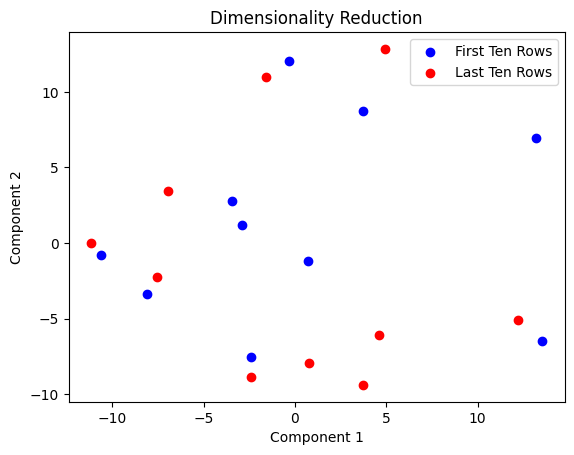

In [65]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import torch

pos_sample_memory = ckpt['embedding_layer.pos_sample_memory'][3].float()
neg_sample_memory = ckpt['embedding_layer.neg_sample_memory'][3].float()

matrix = torch.cat([pos_sample_memory, neg_sample_memory], dim=0).cpu().numpy()

# 标准化数据
scaler = StandardScaler()
scaled_matrix = scaler.fit_transform(matrix)

# 使用PCA进行降维
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(scaled_matrix)

# 将矩阵的前十行和后十行分别提取出来
first_ten_rows = reduced_data[:10, :]
last_ten_rows = reduced_data[-10:, :]

# 可视化降维结果
plt.scatter(first_ten_rows[:, 0], first_ten_rows[:, 1], c='blue', label='First Ten Rows')
plt.scatter(last_ten_rows[:, 0], last_ten_rows[:, 1], c='red', label='Last Ten Rows')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Dimensionality Reduction')
plt.legend()
plt.show()

In [14]:
import torch.nn.functional as F
prototype = ckpt['embedding_layer.prototype'].float()
prototype = F.softmax(prototype, dim=-1)

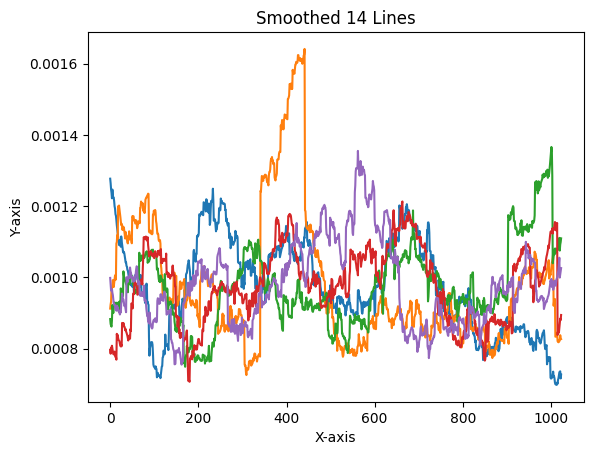

In [27]:
import numpy as np
import matplotlib.pyplot as plt

tensor = prototype[:5,:].cpu().numpy()

# 平滑处理
smoothed_tensor = np.zeros_like(tensor)
window_size = 100  # 滑动窗口大小

for i in range(tensor.shape[0]):
    for j in range(tensor.shape[1]):
        start_index = max(0, j - window_size // 2)
        end_index = min(tensor.shape[1], j + window_size // 2 + 1)
        smoothed_tensor[i, j] = np.mean(tensor[i, start_index:end_index])

# 创建画布和子图
fig, ax = plt.subplots()

# 绘制平滑后的折线
for i in range(smoothed_tensor.shape[0]):
    ax.plot(smoothed_tensor[i, :])

# 设置标题和坐标轴标签
ax.set_title('Smoothed 14 Lines')
ax.set_xlabel('X-axis')
ax.set_ylabel('Y-axis')

# 显示图形
plt.show()

In [1]:
import pandas as pd

data1 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/results/vit3d-radfm_perceiver-radfm_llama2-7b-chat-hf_ctr_prototype-prompt.csv')
data2 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/results/vit3d-radfm_perceiver-radfm_llama2-7b-chat-hf_cls-labels.csv')

In [13]:
sorted(list(data1['ID'])) == sorted(list(data2['ID']))

True

# disease attention weight analysis

In [23]:
import torch
ckpt = torch.load(
        '/data/chenzhixuan/checkpoints/LLM4CTRG/outputs/vit3d-radfm_perceiver-radfm_llama2-7b-chat-hf_ctr/checkpoint-2000/pytorch_model.bin', map_location='cpu')
disease_attn_all = ckpt['embedding_layer.prototype'].float()

In [24]:
disease_attn = torch.nn.functional.softmax(disease_attn_all, dim=-1)
disease_attn = disease_attn.reshape(14, 8, 8, 16)
disease_attn = disease_attn[:,:,:,4]


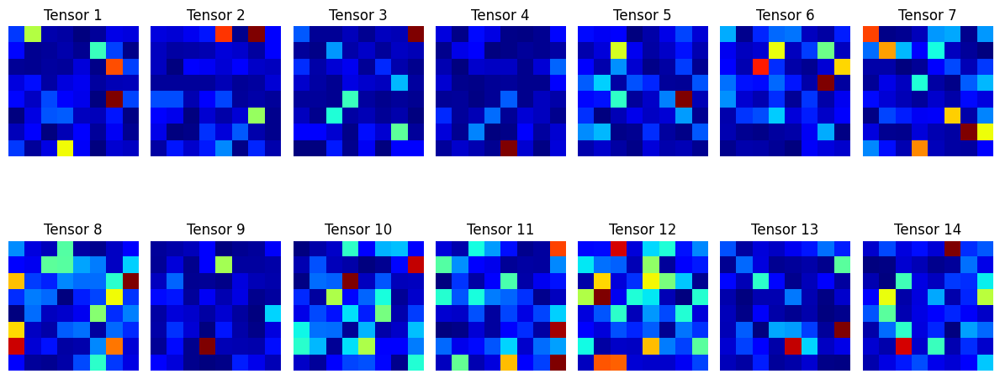

In [25]:
import numpy as np
import matplotlib.pyplot as plt

# 创建一个三维张量
tensor = disease_attn.cpu().numpy()

# 创建子图布局
fig, axs = plt.subplots(2, 7, figsize=(12, 6))

# 展示每张热力图
for i in range(14):
    ax = axs[i // 7, i % 7]
    heatmap=ax.imshow(tensor[i], cmap='jet', interpolation='nearest')
    ax.set_title('Tensor {}'.format(i+1))
    ax.axis('off')

# 调整子图布局
plt.tight_layout()

# plt.colorbar(heatmap, orientation='horizontal')

# 显示图像
plt.show()

# disease f1 distribution

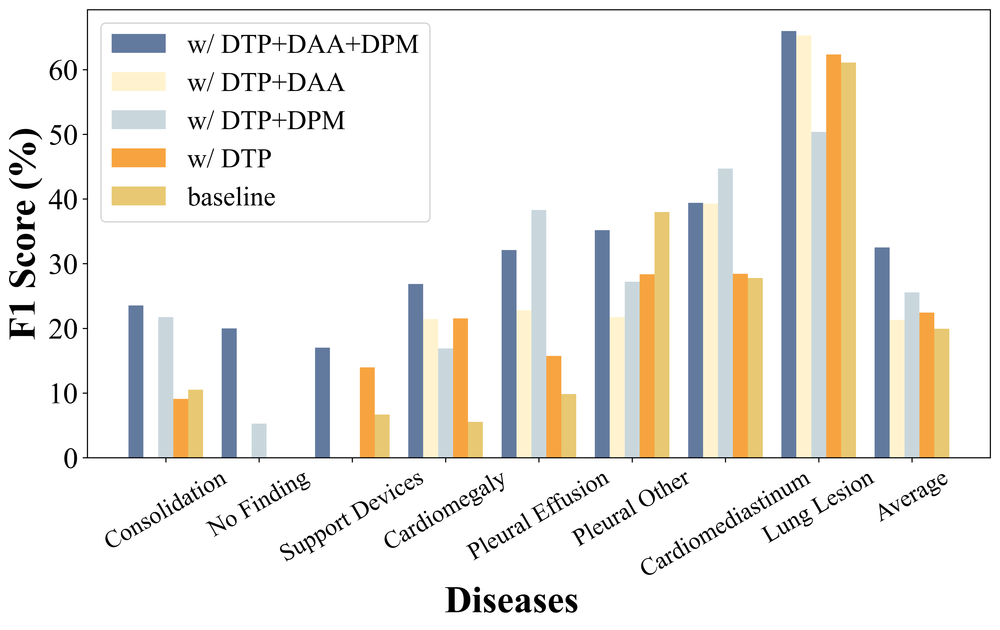

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import json


data1 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/experiment/disease_f1_distribution/DPB_DAA_PDP.csv')
data2 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/experiment/disease_f1_distribution/PDP+DAA.csv')
data3 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/experiment/disease_f1_distribution/PDP+DPB.csv')
data4 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/experiment/disease_f1_distribution/PDP.csv')
data5 = pd.read_csv('/home/chenzhixuan/Workspace/LLM4CTRG/experiment/disease_f1_distribution/Original.csv')

plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Times New Roman'

# 读取json进行排序
ratio = json.load(open('/home/chenzhixuan/Workspace/PromptMRG/data/ctrg/base_probs.json'))
sorted_ratio = sorted(ratio)
sorted_indices = sorted(range(len(ratio)), key=lambda x: ratio[x])
sorted_indices = sorted_indices[-8:]

# 假设有四个列表
labels = [
    'Cardiomediastinum', 
    'Cardiomegaly', 
    'Lung Opacity', 
    'Lung Lesion', 
    'Edema', 
    'Consolidation', 
    'Pneumonia', 
    'Atelectasis', 
    'Pneumothorax', 
    'Pleural Effusion', 
    'Pleural Other', 
    'Fracture', 
    'Support Devices', 
    'No Finding']

values1 = data1.values.tolist()[0]  # 第一个柱状图的值
values2 = data2.values.tolist()[0]  # 第二个柱状图的值
values3 = data3.values.tolist()[0]  # 第三个柱状图的值
values4 = data4.values.tolist()[0]  # 第四个柱状图的值
values5 = data5.values.tolist()[0]  # 第五个柱状图的值

# 根据indices排序
labels = [labels[i] for i in sorted_indices]
values1 = [values1[i]*100 for i in sorted_indices]
values2 = [values2[i]*100 for i in sorted_indices]
values3 = [values3[i]*100 for i in sorted_indices]
values4 = [values4[i]*100 for i in sorted_indices]
values5 = [values5[i]*100 for i in sorted_indices]

# 在末尾增加平均值元素
labels.append('Average')
values1.append(np.mean(values1))
values2.append(np.mean(values2))
values3.append(np.mean(values3))
values4.append(np.mean(values4))
values5.append(np.mean(values5))

# 设置柱状图的宽度
bar_width = 0.16

# 生成 X 轴位置
x = np.arange(len(labels))

# 定义颜色
color1 = '#637a9f'
color2 = '#fff3cf'
color3 = '#f7a440'
color4 = '#e8c872'
color5 = '#c9d7dd'

# 调整图像大小
plt.figure(figsize=(12, 6), dpi=600)

# 绘制并列柱状图，并指定颜色
bars1 = plt.bar(x - 2*bar_width, values1, width=bar_width, label='w/ DTP+DAA+DPM', color=color1)
bars2 = plt.bar(x - 1*bar_width, values2, width=bar_width, label='w/ DTP+DAA', color=color2)
bars3 = plt.bar(x, values3, width=bar_width, label='w/ DTP+DPM', color=color5)
bars4 = plt.bar(x + 1*bar_width, values4, width=bar_width, label='w/ DTP', color=color3)
bars5 = plt.bar(x + 2*bar_width, values5, width=bar_width, label='baseline', color=color4)

# 在每个柱子的顶部显示高度标签...
# for i, value in enumerate(values1):
#     plt.text(i - 2*bar_width, value, "{:.1f}".format(value), ha='center', va='bottom', fontsize=6)

# for i, value in enumerate(values2):
#     plt.text(i - 1*bar_width, value, "{:.1f}".format(value), ha='center', va='bottom', fontsize=6)

# for i, value in enumerate(values3):
#     plt.text(i, value, "{:.1f}".format(value), ha='center', va='bottom', fontsize=6)

# for i, value in enumerate(values4):
#     plt.text(i + 1*bar_width, value, "{:.1f}".format(value), ha='center', va='bottom', fontsize=6)

# for i, value in enumerate(values5):
#     plt.text(i + 2*bar_width, value, "{:.1f}".format(value), ha='center', va='bottom', fontsize=6)

# 设置标题
plt.xlabel('Diseases', fontsize=28, fontweight='bold', ha='center')
plt.ylabel('F1 Score (%)', fontsize=28, fontweight='bold', ha='center')

# 调整 X 轴标题位置
x_label = plt.gca().xaxis.get_label()
x_label.set_position((0.47, -0.1))

# 调整 Y 轴标题位置
y_label = plt.gca().yaxis.get_label()
y_label.set_position((-0.1, 0.5))

plt.yticks(fontsize=22)

# 设置 X 轴标签和图例
plt.xticks(x, labels, rotation=30, fontsize=18, position=(0, 0))
plt.legend(fontsize=20)

# 显示图像
plt.show()

In [13]:
import json
import numpy as np
ratio = json.load(open('/home/chenzhixuan/Workspace/PromptMRG/data/ctrg/base_probs.json'))
sorted_ratio = sorted(ratio, reverse=True)
sorted_indices = sorted(range(len(ratio)), key=lambda x: ratio[x], reverse=True)

# the figures of yequan

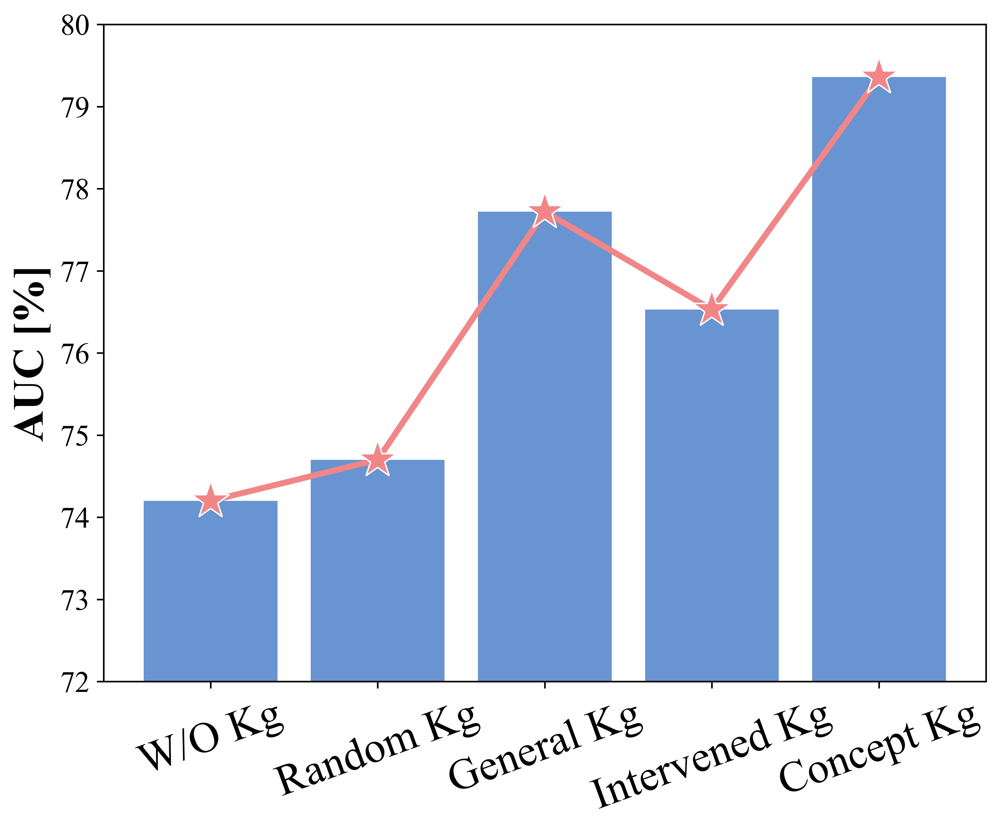

In [59]:
import seaborn as sns

plt.rc('font',family='Times New Roman')
plt.rcParams['font.size'] = 15
# Derm7pt
x = [1, 2, 3, 4]
x = ["Derm7pt", "SkinCon", "IU X-ray", "Pneumonia"]
x = ["W/O Knowledge", "General Knowledge", "Intervened Knowledge", "Concept-based Knowledge"]
x = ["W/O Kg", "General Kg", "Intervened Kg", "Concept-based Kg"]
x = ["W/O Kg", "Random Kg", "General Kg", "Intervened Kg", "Concept Kg"]

# derm7pt = [74.2, 77.72, 76.53, 79.36]
derm7pt = [74.2, 74.7, 77.72, 76.53, 79.36]

plt.rcParams['axes.facecolor'] = 'white'
# Set Seaborn style
plt.figure(figsize=(8, 6), dpi=600)
# o, s, ^, *
# Solid line with circle markers
#sns.lineplot(x=x, y=derm7pt, linestyle='-', marker='*', markersize=15, label='Derm7pt', color='orange') 
sns.lineplot(x=x, y=derm7pt, linestyle='-', linewidth=3, marker='*', markersize=20, label='Derm7pt', color='#f28585') 

plt.xticks(rotation=20, fontsize=22)  # 旋转 x 轴刻度标签

plt.bar(x, derm7pt, color = "#6895d2")
plt.ylim(72, 80)
# plt.title('Derm7pt', fontweight='bold', fontdict={'fontsize': 15}) # Add a title
# plt.title('Concept-based Knowledge Intervention', fontweight='bold', fontdict={'fontsize': 18}) # Add a title

plt.ylabel('AUC [%]', fontdict={'fontsize': 22}, fontweight='bold',) # y-axis name

plt.legend().remove()
# plt.savefig('figures/kg_intervention4.pdf')
plt.show()

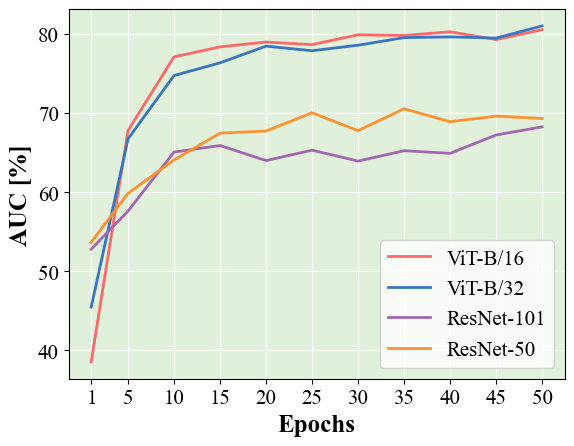

In [103]:
# 生成数据
epochs = [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50]
vit_b16 = [38.52, 67.79, 77.11, 78.38, 78.99, 78.66, 79.91, 79.82, 80.29, 79.3, 80.56]
vit_b32 = [45.46, 66.74, 74.75, 76.36, 78.47, 77.89, 78.59, 79.55, 79.64, 79.49, 81.03]
rn_101 = [52.78, 57.61, 65.07, 65.9, 63.99, 65.31, 63.93, 65.24, 64.91, 67.23, 68.26]
rn_50 = [53.66, 59.84, 64.07, 67.46, 67.73, 70.04, 67.78, 70.55, 68.91, 69.62, 69.32]

y = [6, 8, 7, 9, 5, 6, 4, 3]
 
# 创建画布和子图对象
fig, ax = plt.subplots()
 
# 绘制折线图
plt.plot(epochs, vit_b16, label='ViT-B/16', color='#ff6868', linewidth=2)
plt.plot(epochs, vit_b32, label='ViT-B/32', color='#3876bf', linewidth=2)
plt.plot(epochs, rn_101, label='ResNet-101', color='#a367b1', linewidth=2)
plt.plot(epochs, rn_50, label='ResNet-50', color='#ff9130', linewidth=2)
 
# 设置网格线样式
ax.grid(True, color="w")
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['axes.facecolor'] = '#e1f0da'

#ax.spines['left'].set_edgecolor('white')
# 显示图形
plt.xticks(epochs)
plt.xlabel("Epochs", weight='bold', fontsize=18)
plt.ylabel("AUC [%]", weight='bold', fontsize=18)
plt.legend(fontsize=15, facecolor='white')
# plt.savefig('figures/diff_backbones3.pdf')
plt.show()

# mimic dataset

In [108]:
import torch
from torchvision import transforms
from PIL import Image


path = "/jhcnas1/chenzhixuan/data/mimic-cxr-jpg/images_resized/p10/p10942925/s56367190/0b6b7da5-b7fe77e3-ca20ed7a-9edec2cc-7b2538e1.jpg"

# 打开图像文件
image = Image.open(path)

# 定义转换操作
transform = transforms.ToTensor()

# 对图像进行转换
tensor_image = transform(image)

# 打印张量的形状和数据类型
print(tensor_image.shape)
print(tensor_image.dtype)



torch.Size([3, 256, 256])
torch.float32


In [2]:
import json

# 读取 JSON 文件
data_json = json.load(open('/jhcnas1/chenzhixuan/data/mimic-cxr-jpg/annotation_with_label.json'))

In [5]:
data_json

{'train': [{'id': '02aa804e-bde0afdd-112c0b34-7bc16630-4e384014',
   'study_id': 50414267,
   'subject_id': 10000032,
   'report': 'There is no focal consolidation, pleural effusion or pneumothorax.  Bilateral\n nodular opacities that most likely represent nipple shadows. The\n cardiomediastinal silhouette is normal.  Clips project over the left lung,\n potentially within the breast. The imaged upper abdomen is unremarkable.\n Chronic deformity of the posterior left sixth and seventh ribs are noted.',
   'image_path': ['p10/p10000032/s50414267/02aa804e-bde0afdd-112c0b34-7bc16630-4e384014.jpg'],
   'split': 'train',
   'labels': [2, 0, 0, 1, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0]},
  {'id': '174413ec-4ec4c1f7-34ea26b7-c5f994f8-79ef1962',
   'study_id': 50414267,
   'subject_id': 10000032,
   'report': 'There is no focal consolidation, pleural effusion or pneumothorax.  Bilateral\n nodular opacities that most likely represent nipple shadows. The\n cardiomediastinal silhouette is normal.  Clips pr

# check iu_xray

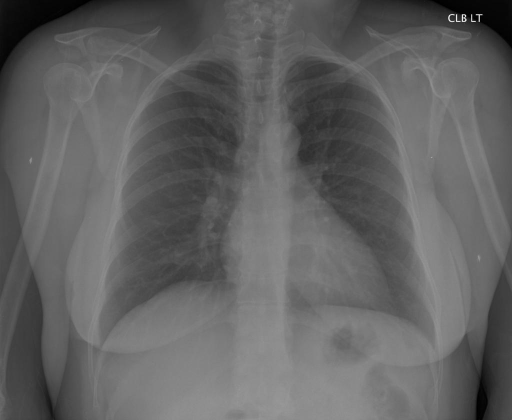

In [3]:
from PIL import Image
from IPython.display import display

# 读取图像
image = Image.open("/ssd1/chenzhixuan/data/iu_xray/images/CXR2638_IM-1123/0.png")

# 显示图像
display(image)

## add labels

In [39]:
import json
from utils.chexbert import CheXbert
import numpy as np

chexbert = CheXbert('/home/chenzhixuan/Workspace/MRG_baseline/checkpoints/stanford/chexbert/chexbert.pth', 'cpu').to('cpu')

# 读取JSON文件
with open('/ssd1/chenzhixuan/data/iu_xray/annotation.json', 'r') as file:
    data = json.load(file)

for item in data['train']:
    report = item['report']
    labels = chexbert([report])[0]
    item['labels'] = np.array(labels).tolist()

for item in data['val']:
    report = item['report']
    labels = chexbert([report])[0]
    item['labels'] = np.array(labels).tolist()

for item in data['test']:
    report = item['report']
    labels = chexbert([report])[0]
    item['labels'] = np.array(labels).tolist()



In [41]:
data

{'train': [{'id': 'CXR2384_IM-0942',
   'report': 'The heart size and pulmonary vascularity appear within normal limits. A large hiatal hernia is noted. The lungs are free of focal airspace disease. No pneumothorax or pleural effusion is seen. Degenerative changes are present in the spine.',
   'image_path': ['CXR2384_IM-0942/0.png', 'CXR2384_IM-0942/1.png'],
   'split': 'train',
   'labels': [0, 2, 2, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0]},
  {'id': 'CXR2926_IM-1328',
   'report': 'Cardiac and mediastinal contours are within normal limits. The lungs are clear. Bony structures are intact.',
   'image_path': ['CXR2926_IM-1328/0.png', 'CXR2926_IM-1328/1.png'],
   'split': 'train',
   'labels': [2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1]},
  {'id': 'CXR1451_IM-0291',
   'report': 'Left lower lobe calcified granuloma. Heart size normal. No pleural effusion or pneumothorax. Mild medial right atelectasis. Mild emphysema.',
   'image_path': ['CXR1451_IM-0291/0.png', 'CXR1451_IM-0291/1.png'],
   'sp

In [40]:
# save the data
with open('/ssd1/chenzhixuan/data/iu_xray/annotation_with_label.json', 'w') as file:
    json.dump(data, file)

In [1]:
# read json
import json
data1 = json.load(open('/data/chenzhixuan/data/CTRG/chest_ctrg.json'))
data2 = json.load(open('/jhcnas1/chenzhixuan/CTRG/Chest_new_1/annotation2_new.json'))